In [1]:
import os
import pathlib

import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
import tensorflow_hub as hub

tf.get_logger().setLevel('ERROR')

2021-11-25 10:29:40.747438: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-11-25 10:29:40.747465: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Need put path to your directory

In [2]:
# you can add all models, from https://tfhub.dev/tensorflow/collections/object_detection/1, for expiriments I chose 4
MODELS = {
'EfficientDet' : 'https://tfhub.dev/tensorflow/efficientdet/d1/1',
'SSD MobileNet' : 'https://tfhub.dev/tensorflow/ssd_mobilenet_v1/fpn_640x640/1',
'SSD ResNet152' : 'https://tfhub.dev/tensorflow/retinanet/resnet152_v1_fpn_640x640/1',
'Faster R-CNN' : 'https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1'
}


COCO17_HUMAN_POSE_KEYPOINTS = [(0, 1),
 (0, 2),
 (1, 3),
 (2, 4),
 (0, 5),
 (0, 6),
 (5, 7),
 (7, 9),
 (6, 8),
 (8, 10),
 (5, 6),
 (5, 11),
 (6, 12),
 (11, 12),
 (11, 13),
 (13, 15),
 (12, 14),
 (14, 16)]

In [3]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

from object_detection.utils import ops as utils_ops
%matplotlib inline

In [4]:
# patch tf1 into `utils.ops`
utils_ops.tf = tf.compat.v1

# Patch the location of gfile
tf.gfile = tf.io.gfile

In [5]:
PATH_TO_LABELS = 'mscoco_label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

You can chose preffered model 


In [6]:
model_display_name = 'Faster R-CNN' # @param ['EfficientDet ','SSD MobileNet' ,'SSD ResNet152' ,'Faster R-CNN']
model_handle = MODELS[model_display_name]

print('Selected model:'+ model_display_name)
print('Model Handle at TensorFlow Hub: {}'.format(model_handle))

Selected model:Faster R-CNN
Model Handle at TensorFlow Hub: https://tfhub.dev/tensorflow/faster_rcnn/resnet152_v1_640x640/1


In [7]:
print('loading model...')
hub_model = hub.load(model_handle)
print('model loaded!')

loading model...


2021-11-25 10:30:05.529887: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2021-11-25 10:30:05.529928: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
2021-11-25 10:30:05.529964: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (vladimir-ProBook): /proc/driver/nvidia/version does not exist
2021-11-25 10:30:50.881677: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 18874368 exceeds 10% of free system memory.


model loaded!


In [8]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

In [9]:
def show_inference(model, image_path):
  # the array based representation of the image will be used later in order to prepare the
  # result image with boxes and labels on it.
  image_np = np.array(Image.open(image_path))
  # Actual detection.
  output_dict = run_inference_for_single_image(model, image_np)
  # Visualization of the results of a detection.
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

  display(Image.fromarray(image_np))

In [10]:
PATH_TO_TEST_IMAGES_DIR = pathlib.Path('./images/')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))
TEST_IMAGE_PATHS

[PosixPath('images/animal.jpg'),
 PosixPath('images/bmw.jpg'),
 PosixPath('images/elephant.jpg'),
 PosixPath('images/man.jpg'),
 PosixPath('images/meeting.jpg'),
 PosixPath('images/oldtimer.jpg')]

2021-11-25 10:30:56.996171: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2021-11-25 10:31:02.260905: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 26214400 exceeds 10% of free system memory.
2021-11-25 10:31:02.623790: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 26214400 exceeds 10% of free system memory.
2021-11-25 10:31:02.778880: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 26214400 exceeds 10% of free system memory.
2021-11-25 10:31:02.963191: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 26214400 exceeds 10% of free system memory.


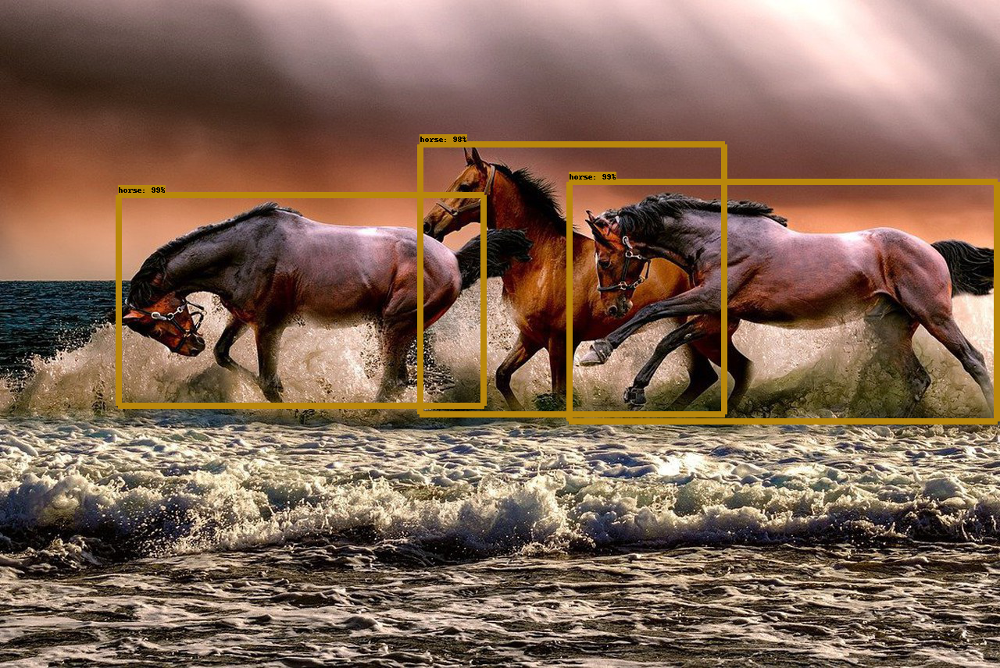

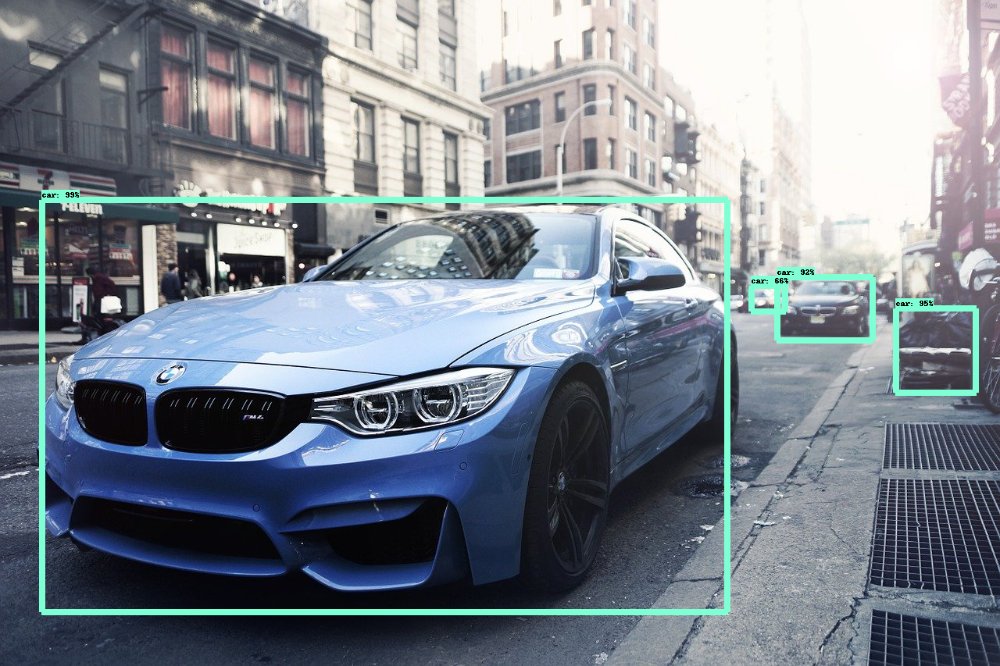

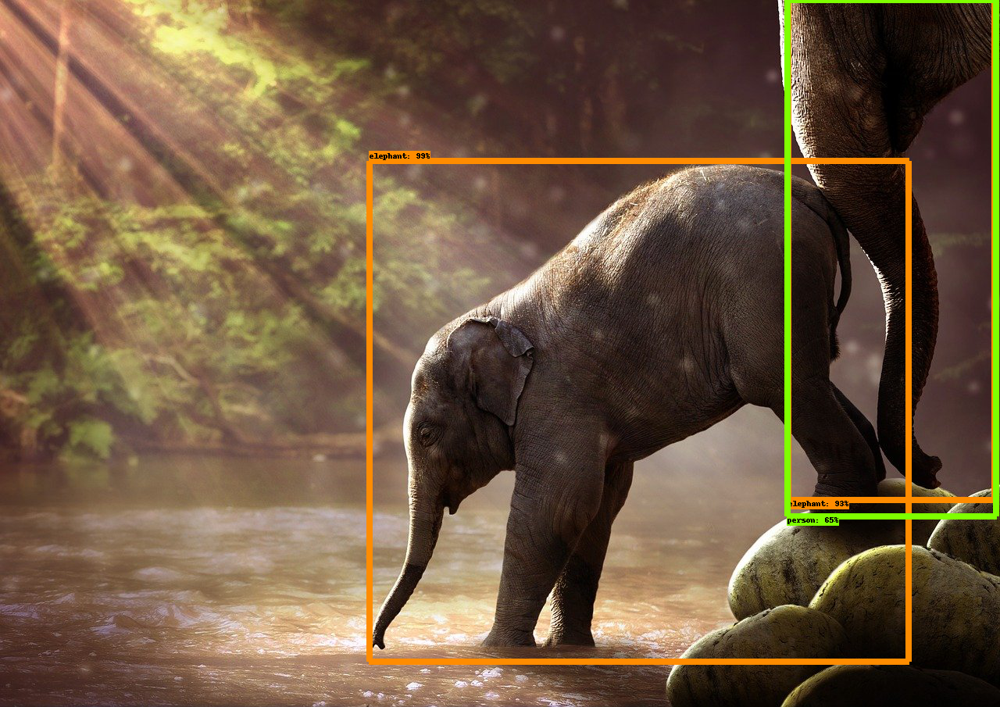

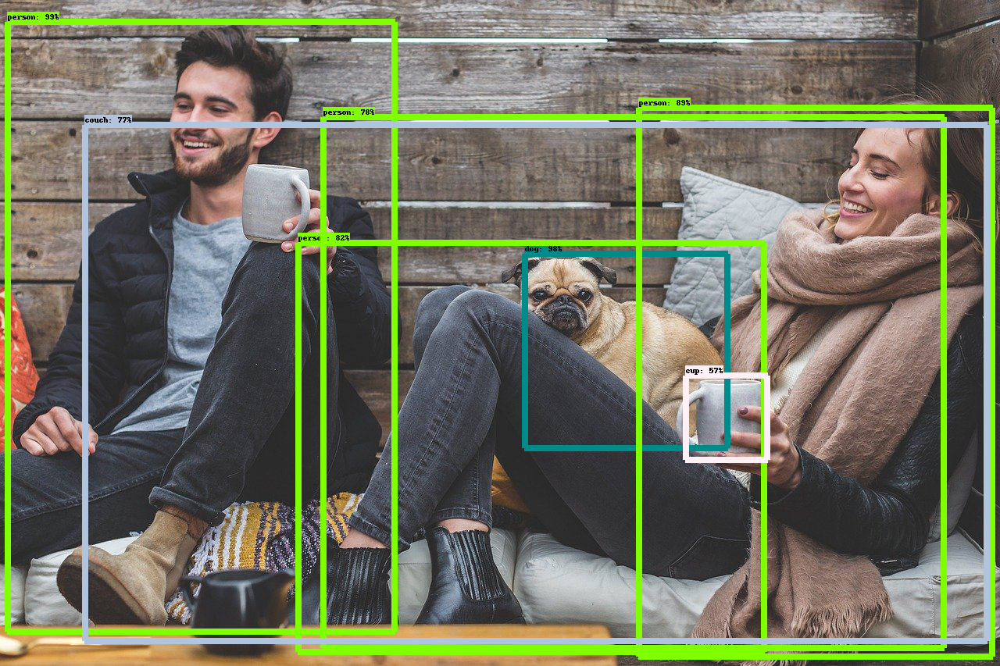

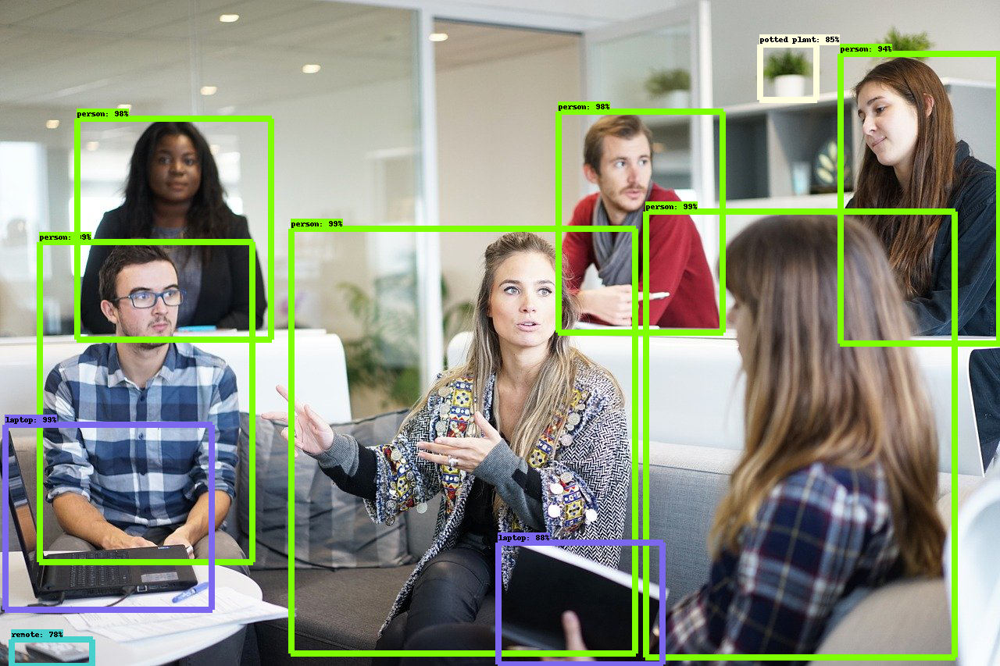

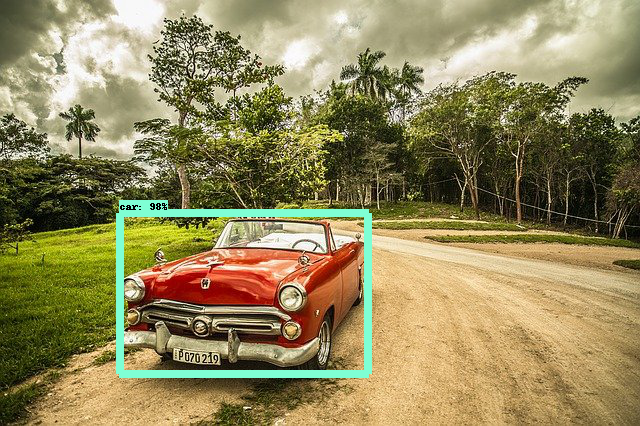

In [11]:
for image_path in TEST_IMAGE_PATHS:
  show_inference(hub_model, image_path)

In [12]:
!pip3 freeze > requirements_obj_det.txt